---
title: Fig. 7 - Tuning for metabolite-species pairs
author: Benjamin Doran
date: today
---

In [94]:
#| code-summary: julia setup
#| code-fold: true
using DrWatson
@quickactivate projectdir()

using SpectralInference
using NewickTree
using MLJ
using GLMNet: GLMNet, glmnet
using Chain
using Distributions: Normal
using MLJBase: train_test_pairs
using Distances, Clustering
using Distributions
using Printf: @sprintf
using Muon, CSV, DataFrames
using Gotree_jll
using Random: seed!
using FreqTables
using NearestNeighbors
using HypothesisTests
using MultipleTesting: adjust, Bonferroni, BenjaminiHochberg
using DataFramesMeta, LaTeXStrings
using StatsPlots, StatsBase
theme(:default, grid=false, tickdir=:out, label="")
include(srcdir("helpers.jl"))
adjust_rsquared(r2, n, df) = 1 - (1 - r2) * ((n - 1) / (n - 1 - df))
shannon(x) = x |> countmap |> values |> x -> x ./ maximum(x) |> entropy

ddir = datadir("exp_raw", "BB669")
rdir = projectdir("_research", "metabolite_model_outofbag") |> mkpath
pdir = plotsdir("metabolite_model_outofbag") |> mkpath
supptbl_dir = projectdir("_research", "SuppTables") |> mkpath

speciescolordf = CSV.read(datadir("exp_raw", "BB669", "subsettreecolors.csv"), DataFrame)
species_color_dict = Dict(k => v for (k, v) in zip(speciescolordf.species_name, speciescolordf.color));

# Main - Model statistics on metabolite-species pairs

In [2]:
# uniprot = readh5ad(datadir("exp_raw", "UP7047", "2020_02_UP7047.h5ad"))
biobank = readh5mu(joinpath(ddir, "BB669.h5mu"))
full_train_mask = biobank.obs.kept_species .= biobank.obs.kept_species .== 1;

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/bend/.julia/packages/Muon/UKjAF/src/mudata.jl:367


In [3]:
oof_preds_df_stacked = CSV.read(joinpath(rdir, "oof_predictions_stacked_SLE_lambda=many.csv"), DataFrame)
oof_preds_df_stacked =
    @chain oof_preds_df_stacked begin
        stack(8:108)
        transform!(:variable => ByRow(s -> parse(Float64, last(split(s, "_")))) => :lambda)
        select(Not([:variable, :value]), :value => :preds)
    end
coefdf_stacked =
    @chain CSV.read(joinpath(rdir, "coefs_SLE_lambda=many.csv"), DataFrame) begin
        stack(6:106)
        transform!(:variable => ByRow(s -> parse(Float64, last(split(s, "_")))) => :lambda)
        select(Not([:variable, :value]), :value => :coef)
    end
mdlstatsdf_stacked =
    @chain coefdf_stacked begin
        groupby([:metabolite_label, :fold, :resample, :lambda])
        combine(
            :coef => (x -> sum(x .!= 0)) => :degrees_freedom,
            :fold => (x -> (3 / 4 * sum(full_train_mask) - 1)) => :orig_degrees_freedom, # num params possible
            :coef => (x -> mean(x .!= 0)) => :degrees_freedom_prop,
            [:num_species_descendents, :coef] => ((n, c) -> mean((n.==11)[(c.!=0)])) => :phylum_level,
            [:num_species_descendents, :coef] => ((n, c) -> mean((1 .< n .< 11)[(c.!=0)])) => :species_level,
            [:num_species_descendents, :coef] => ((n, c) -> mean((n.==1)[(c.!=0)])) => :strain_level,
        )
    end
mdlstatsdf =
    @chain oof_preds_df_stacked begin
        groupby([:metabolite_label, :fold, :resample, :lambda])
        combine(
            [:truth, :preds] => ((y, yhat) -> rsquared(yhat, y)) => :rsq,
            [:truth, :preds] => ((y, yhat) -> cor(yhat, y)) => :cor,
            :truth => std,
            :preds => std,
        )
        leftjoin(mdlstatsdf_stacked, on=[:metabolite_label, :fold, :resample, :lambda])
        transform!(
            [:rsq, :orig_degrees_freedom, :degrees_freedom] => ByRow((r, n, d) -> adjust_rsquared(r, n, d)) => :rsq_adj,
            # NaNs appear when predictions are constant, obviously there is no correlation in that case
            :cor => (x -> replace(x, NaN => 0.0)) => identity, 
            :phylum_level => (x -> replace(x, NaN => 0.0)) => identity,
            :species_level => (x -> replace(x, NaN => 0.0)) => identity,
            :strain_level => (x -> replace(x, NaN => 0.0)) => identity,
        )
        select!([:metabolite_label, :fold, :resample, :lambda], :rsq, :rsq_adj, :cor, 6:14)
        disallowmissing
    end;

## bubble plot of species rsqs

In [5]:
mdlstatsdf_meansdf =
    @chain mdlstatsdf begin
        subset(:lambda => ByRow(>=(1e-3)))
        groupby([:metabolite_label, :lambda])
        combine(
            5:15 .=> mean,
            5:15 .=> std,
        )
    end

bestlambdamodels =
    @chain mdlstatsdf_meansdf begin
        groupby(:metabolite_label)
        subset(:rsq_adj_mean => (x -> x .== maximum(x)))
        # subset(:lambda => (x -> x .== 0.01))
    end
# CSV.write(joinpath(rdir, "bestmodels_SLE_oof.csv"), bestlambdamodels)

bestmodels_oofpreds =
    @chain bestlambdamodels begin
        sort(:rsq_adj_mean, rev=true)
        select([:metabolite_label, :lambda, :rsq_adj_mean, :cor_mean])
        leftjoin(oof_preds_df_stacked, on=[:metabolite_label, :lambda])
        leftjoin(mdlstatsdf_stacked, on=[:metabolite_label, :lambda, :fold, :resample])
        leftjoin(select(biobank.obs, [:Strain_ID, :Species, :Donor]), on=:msk_id => :Strain_ID)
    end

# CSV.write(joinpath(rdir, "bestmodels_SLE_oofpreds.csv"), bestmodels_oofpreds)
@show size(bestmodels_oofpreds)
first(bestmodels_oofpreds, 5)

size(bestmodels_oofpreds) = (56960, 19)


Row,metabolite_label,lambda,rsq_adj_mean,cor_mean,row_id,msk_id,metabolite_name,fold,resample,truth,preds,degrees_freedom,orig_degrees_freedom,degrees_freedom_prop,phylum_level,species_level,strain_level,Species,Donor
,String31,Float64,Float64,Float64,Int64?,String15?,String31?,Int64?,Int64?,Float64?,Float64?,Int64?,Float64?,Float64?,Float64?,Float64?,Float64?,String?,String?
1,Acetate,0.0758578,0.678213,0.853746,342,MSK.19.38,Acetate,1,1,2.35396,2.34204,31,266.0,0.116541,0.0,0.290323,0.709677,[Ruminococcus] gnavus,MSK.19
2,Acetate,0.0758578,0.678213,0.853746,90,MSK.22.14,Acetate,1,1,0.198325,1.03033,31,266.0,0.116541,0.0,0.290323,0.709677,Phocaeicola vulgatus,MSK.22
3,Acetate,0.0758578,0.678213,0.853746,121,MSK.22.19,Acetate,1,1,0.906867,0.790439,31,266.0,0.116541,0.0,0.290323,0.709677,[Eubacterium] rectale,MSK.22
4,Acetate,0.0758578,0.678213,0.853746,223,MSK.18.5,Acetate,1,1,2.45019,2.93266,31,266.0,0.116541,0.0,0.290323,0.709677,Blautia luti,MSK.18
5,Acetate,0.0758578,0.678213,0.853746,163,MSK.19.91,Acetate,1,1,0.962586,1.55248,31,266.0,0.116541,0.0,0.290323,0.709677,Bacteroides uniformis,MSK.19


## Predictive capacity of best lambda models regardless of species

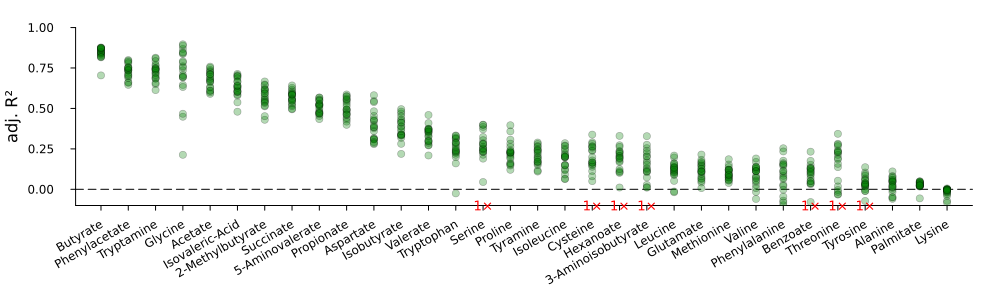

In [6]:
pltdf = @chain bestlambdamodels begin
    select([:metabolite_label, :lambda, :rsq_adj_mean, :rsq_adj_std])
    leftjoin(mdlstatsdf, on=[:metabolite_label, :lambda])
    sort(:rsq_adj_mean, rev=true)
end;

bottomylim = -0.1
plot(
    size=(1000,300),
    ylabel="adj. R²",
    margin=5Plots.mm,
    bottommargin=15Plots.mm,
    ylims=(bottomylim,1),
    xlims=(3, 3 + 32 - 1),
    xwiden=true,
    xrotation=30,
)   
hline!([0], linestyle=:dash, color=:black)
@df pltdf scatter!(:metabolite_label, :rsq_adj,
    xticks=(2.5 .+ (0.5:length(unique(:metabolite_label))), unique(:metabolite_label)),
    marker=(:green, 0.3),
)
# @df filter(:rsq_adj => <(bottomylim), pltdf) annotate!(:metabolite_label, bottomylim, text("×", 9, :red))
@chain filter(:rsq_adj => <(bottomylim), pltdf) begin
    groupby("metabolite_label")
    combine(nrow => :count)
    @df _ annotate!(:metabolite_label, bottomylim, text.((string.(:count)) .* "×", 9, :red))
end

In [7]:
allmodels_oofpreds =
    @chain mdlstatsdf_meansdf begin
        sort(:rsq_adj_mean, rev=true)
        select([:metabolite_label, :lambda, :rsq_adj_mean, :cor_mean])
        leftjoin(oof_preds_df_stacked, on=[:metabolite_label, :lambda])
        leftjoin(mdlstatsdf_stacked, on=[:metabolite_label, :lambda, :fold, :resample])
        leftjoin(select(biobank.obs, [:Strain_ID, :Species, :Donor]), on=:msk_id => :Strain_ID)
    end

allmodels_mdlstats =
    @chain allmodels_oofpreds begin
        groupby([:metabolite_label, :fold, :resample, :lambda, :Species, :Donor])
        transform!(
            :truth => var => :truth_var_by_donor,
            :truth => std => :truth_std_by_donor,
            :truth => mean => :truth_mean_by_donor,
            :Donor => (length ∘ unique) => :donor_count
        )
        groupby([:metabolite_label, :fold, :resample, :lambda, :Species])
        combine(
            :rsq_adj_mean => (only ∘ unique) => :full_adj_rsq_mean,
            :cor_mean => (only ∘ unique) => :cor_mean,
            :degrees_freedom => (only ∘ unique) => identity,
            :orig_degrees_freedom => (only ∘ unique) => identity,
            :donor_count => (only ∘ unique) => identity,
            :strain_level => (only ∘ unique) => identity,
            nrow => :strain_count,
            :truth => std,
            :truth => var,
            :Donor => shannon => :donor_entropy,
            [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsq_by_species,
            [:preds, :truth] => ((yhat, y) -> cor(yhat, y)) => :cor_by_species,
            :truth_mean_by_donor => var,
            :truth_mean_by_donor => std,
            :truth_var_by_donor => (x -> mean(replace(x, NaN => 0.0))) => :truth_var_by_donor_mean,
            :truth_std_by_donor => (x -> mean(replace(x, NaN => 0.0))) => :truth_std_by_donor_mean,
        )
        transform!(
            # NaNs appear when predictions are constant, obviously there is no correlation in that case
            :cor_by_species => (x -> replace(x, NaN => 0.0)) => identity,
            :strain_level => (x -> replace(x, NaN => 0.0)) => identity,
            [:rsq_by_species, :orig_degrees_freedom, :degrees_freedom] => ByRow((r, n, d) -> adjust_rsquared(r, n, d)) => :adj_rsq_by_species,
            [:truth_mean_by_donor_var, :truth_var_by_donor_mean] => ByRow((x, y) -> log2((x + 1 / 2^7) / (y + 1 / 2^7))) => :inter_intra_donor_var,
            [:truth_mean_by_donor_std, :truth_std_by_donor_mean] => ByRow((x, y) -> log2((x + 1 / 2^7) / (y + 1 / 2^7))) => :inter_intra_donor_std,
        )
    end
first(allmodels_mdlstats, 5)

Row,metabolite_label,fold,resample,lambda,Species,full_adj_rsq_mean,cor_mean,degrees_freedom,orig_degrees_freedom,donor_count,strain_level,strain_count,truth_std,truth_var,donor_entropy,rsq_by_species,cor_by_species,truth_mean_by_donor_var,truth_mean_by_donor_std,truth_var_by_donor_mean,truth_std_by_donor_mean,adj_rsq_by_species,inter_intra_donor_var,inter_intra_donor_std
,String31,Int64?,Int64?,Float64,String?,Float64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Acetate,1,1,0.001,[Ruminococcus] gnavus,-0.154249,0.813449,177,266.0,1,0.875706,11,0.463789,0.2151,1.65407,-0.666356,0.382864,0.130366,0.361062,0.0985076,0.237947,-4.018,0.378116,0.585883
2,Acetate,1,1,0.001,Phocaeicola vulgatus,-0.154249,0.813449,177,266.0,1,0.875706,22,0.763553,0.583014,2.98835,-0.214217,0.424436,0.237218,0.48705,0.532039,0.569913,-2.65645,-1.1396,-0.223356
3,Acetate,1,1,0.001,[Eubacterium] rectale,-0.154249,0.813449,177,266.0,1,0.875706,5,0.476332,0.226892,0.27031,-0.676444,-0.198207,0.00891369,0.0944123,0.295344,0.542542,-4.04838,-4.17988,-2.42862
4,Acetate,1,1,0.001,Blautia luti,-0.154249,0.813449,177,266.0,1,0.875706,6,0.58706,0.344639,-0.0,-0.723191,0.278252,0.344639,0.58706,0.0,0.0,-4.18916,5.4955,6.25065
5,Acetate,1,1,0.001,Bacteroides uniformis,-0.154249,0.813449,177,266.0,1,0.875706,7,0.5105,0.26061,0.346574,-1.40749,-0.142759,0.239854,0.489749,0.0355815,0.142613,-6.24983,2.51283,1.72582


## Predictive capacity of models with tuned penalty across species

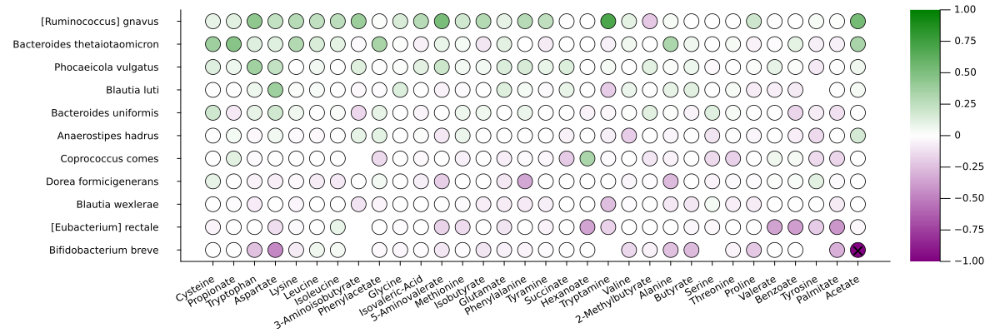

In [8]:
pltdf =
    @chain allmodels_mdlstats begin
        # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
        groupby([:metabolite_label, :fold, :resample, :Species])
        subset(:rsq_by_species => (x -> x .== maximum(x)))
        groupby([:metabolite_label, :fold, :resample, :Species])
        subset(
            :lambda => (x -> x .== maximum(x)),
            :truth_std => ByRow(>(0)),
        )
        groupby([:metabolite_label, :Species])
        combine(
            :rsq_by_species => median,
            :adj_rsq_by_species => median,
            :cor_by_species => median,
        )
    end
first(pltdf, 5)

pltdf_speciesspecific =
    @chain pltdf begin
        groupby([:metabolite_label])
        transform!(:rsq_by_species_median => mean => s -> s * "_met_mean")
        groupby([:Species])
        transform!(:rsq_by_species_median => mean => s -> s * "_spe_mean")
        sort([:rsq_by_species_median_spe_mean, :rsq_by_species_median_met_mean], rev=true)
    end;

pltdf_predcap_speciesspecific = @chain pltdf_speciesspecific begin
    groupby(:Species)
    combine(
        :rsq_by_species_median => mean,
        :cor_by_species_median => mean,
    )
end

plot(
    size=(1200, 400),
    leftmargin=5Plots.mm,
    bottommargin=12Plots.mm,
    xrotation=30,
    yflip=true,
    widen=1.1,
)
@df pltdf_speciesspecific scatter!(:metabolite_label, :Species,
    marker_z=:rsq_by_species_median, clims=(-1, 1),
    colormap=cgrad([:purple, :white, :green,]),
    ms=10,
    xticks=(0.5:length(unique(:metabolite_label)), unique(:metabolite_label)),
)
@df subset(pltdf_speciesspecific, :rsq_by_species_median => ByRow(<(-1))) annotate!(:metabolite_label, :Species, text("×"))

In [9]:
savefig(joinpath(pdir, "bubbleplot_best-rsq-by-species-median_foreach-metabolite.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/bubbleplot_best-rsq-by-species-median_foreach-metabolite.pdf"

## Predictive capacity of models with uniform penalty across species

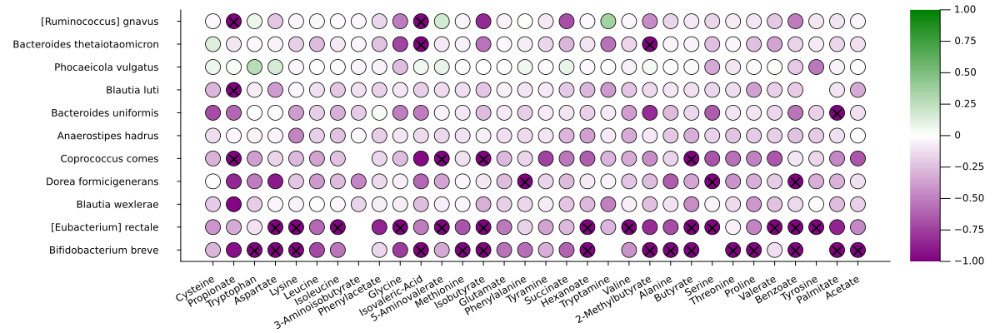

In [10]:
pltdf_acrossspecies =
    @chain allmodels_mdlstats begin
        # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
        groupby([:metabolite_label, :fold, :resample, :Species])
        subset(:full_adj_rsq_mean => (x -> x .== maximum(x)))
        groupby([:metabolite_label, :fold, :resample, :Species])
        subset(
            :lambda => (x -> x .== maximum(x)),
            :truth_std => ByRow(>(0)),
        )
        groupby([:metabolite_label, :Species])
        combine(
            :rsq_by_species => median,
            :cor_by_species => median,
        )
        leftjoin(pltdf_speciesspecific[!, [:metabolite_label, :Species, :rsq_by_species_median_spe_mean, :rsq_by_species_median_met_mean]], on=[:metabolite_label, :Species])
        # groupby([:metabolite_label])
        # transform!(:rsq_by_species_median => mean => s -> s * "_met_mean")
        # groupby([:Species])
        # transform!(:rsq_by_species_median => mean => s -> s * "_spe_mean")
        sort([:rsq_by_species_median_spe_mean, :rsq_by_species_median_met_mean], rev=true)
    end

pltdf_predcap_acrossspecies = @chain pltdf_acrossspecies begin
    groupby(:Species)
    combine(
        :rsq_by_species_median => mean,
        :cor_by_species_median => mean,
    )
end

plot(
    size=(1200, 400),
    leftmargin=5Plots.mm,
    bottommargin=12Plots.mm,
    xrotation=30,
    yflip=true,
    widen=1.1,
)
@df pltdf_acrossspecies scatter!(:metabolite_label, :Species,
    marker_z=:rsq_by_species_median, clims=(-1, 1),
    colormap=cgrad([:purple, :white, :green,]),
    ms=10,
    xticks=(0.5:length(unique(:metabolite_label)), unique(:metabolite_label)),
)
@df subset(pltdf_acrossspecies, :rsq_by_species_median => ByRow(<(-1))) annotate!(:metabolite_label, :Species, text("×"))

In [11]:
savefig(joinpath(pdir, "overallbestlambdamodels_by_lambda_bubble_plot.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/overallbestlambdamodels_by_lambda_bubble_plot.pdf"

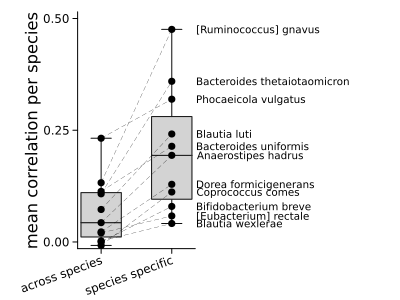

In [12]:
plot(size=(400, 300), 
    ylabel="mean correlation per species", 
    xrotation=20, 
    leftmargin=5Plots.mm,
    rightmargin=5Plots.cm,
    ylims=(0,0.5),
    widen=true,
    yticks=[0, 0.25, 0.5]
)
@df pltdf_predcap_acrossspecies boxplot!(["across species"], :cor_by_species_median_mean, color=:lightgrey)
@df pltdf_predcap_acrossspecies dotplot!(["across species"], :cor_by_species_median_mean, mode=:none, color=:black, msw=0)
@df pltdf_predcap_speciesspecific boxplot!(["species specific"], :cor_by_species_median_mean, color=:lightgrey)
@df pltdf_predcap_speciesspecific dotplot!(["species specific"], :cor_by_species_median_mean, mode=:none, color=:black, msw=0)

xs = [[0.5, 1.9, NaN] for _ in 1:nrow(pltdf_predcap_acrossspecies)] |> 
    x->reduce(vcat, x);
ys = [[y1, y2, NaN] for (y1, y2) in zip(
    pltdf_predcap_acrossspecies.cor_by_species_median_mean,
    pltdf_predcap_speciesspecific.cor_by_species_median_mean,
)] |> x->reduce(vcat, x);
plot!(xs, ys, linewidth=0.25, linestyle=:dash, color=:black)

@df pltdf_predcap_speciesspecific annotate!([2.4], :cor_by_species_median_mean, text.(:Species, :left, 7))

In [13]:
savefig(joinpath(pdir, "mean-correlations-per-species.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/mean-correlations-per-species.pdf"

## Improvement of B. theta & B. luti

In [14]:
speciesselection = [
    "Blautia luti",
    "Bacteroides thetaiotaomicron",
]
pltdf_speciesspecific = @chain allmodels_mdlstats begin
    # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(:rsq_by_species => (x -> x .== maximum(x)))
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(
        :lambda => (x -> x .== maximum(x)),
        :truth_std => ByRow(>(0)),
        :Species => ByRow(∈(speciesselection))
    )
    DataFrames.transform(
        :strain_level => (x -> replace(x, NaN => 0.0)) => identity,
    )
    groupby([:metabolite_label, :Species])
    combine(
        :rsq_by_species => median,
        :rsq_by_species => mean,
        :cor_by_species => median,
        :cor_by_species => mean,
    )
    sort(:Species)
end

pltdf_acrossspecies = @chain allmodels_mdlstats begin
    # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(:full_adj_rsq_mean => (x -> x .== maximum(x)))
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(
        :lambda => (x -> x .== maximum(x)),
        :truth_std => ByRow(>(0)),
        :Species => ByRow(∈(speciesselection))
    )
    DataFrames.transform(
        :strain_level => (x -> replace(x, NaN => 0.0)) => identity,
    )
    groupby([:metabolite_label, :Species])
    combine(
        :rsq_by_species => median,
        :rsq_by_species => mean,
        :cor_by_species => median,
        :cor_by_species => mean,
    )
    sort(:Species)
end;

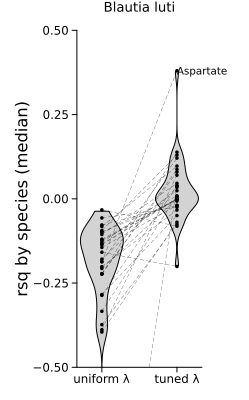

In [15]:
plot(size=(250, 400),
    title=speciesselection[1],
    titlefontsize=9,
    leftmargin=5Plots.mm,
    rightmargin=1Plots.cm,
    ylabel="rsq by species (median)",
    # xrotation=10,
    yticks=[-0.5, -0.25, 0.0, 0.25, 0.5],
    ylims=(-0.5, 0.5)
)
@df filter(:Species => ==(speciesselection[1]), pltdf_acrossspecies) violin!(
    ["uniform λ"], :rsq_by_species_median,
    color=:lightgrey,
    outliers=false,
)

@df filter(:Species => ==(speciesselection[1]), pltdf_acrossspecies) dotplot!(
    ["uniform λ"], :rsq_by_species_median,
    ms=2, msw=0, color=:black, mode=:none,
)
@df filter(:Species => ==(speciesselection[1]), pltdf_speciesspecific) violin!(
    ["tuned λ"], :rsq_by_species_median,
    color=:lightgrey,
    outliers=false,
)

@df filter(:Species => ==(speciesselection[1]), pltdf_speciesspecific) dotplot!(
    ["tuned λ"], :rsq_by_species_median,
    ms=2, msw=0, color=:black, mode=:none,
)

xs = [[0.5, 1.9, NaN] for _ in 1:nrow(filter(:Species => ==(speciesselection[1]), pltdf_acrossspecies))] |> 
    x->reduce(vcat, x);
ys = [[y1, y2, NaN] for (y1, y2) in zip(
    filter(:Species => ==(speciesselection[1]), pltdf_acrossspecies).rsq_by_species_median,
    filter(:Species => ==(speciesselection[1]), pltdf_speciesspecific).rsq_by_species_median,
)] |> x->reduce(vcat, x);
plot!(xs, ys, linewidth=0.25, linestyle=:dash, color=:black)

@df subset(pltdf_speciesspecific,
    :rsq_by_species_median => ByRow(>(0.2)),
    :Species => ByRow(==(speciesselection[1]))
) annotate!(
    ["tuned λ"], :rsq_by_species_median, text.(:metabolite_label, :left, 7),
)

In [16]:
savefig(joinpath(pdir, "bluti-rsq_by_species-violins.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/bluti-rsq_by_species-violins.pdf"

In [17]:
subset(pltdf_acrossspecies, 
    :rsq_by_species_median => ByRow(<(-0.5)), 
    :Species=>ByRow(==(speciesselection[1])))

Row,metabolite_label,Species,rsq_by_species_median,rsq_by_species_mean,cor_by_species_median,cor_by_species_mean
,String31,String?,Float64,Float64,Float64,Float64
1,Propionate,Blautia luti,-1.43024,-7.03868,0.0,-0.141891


In [18]:
MannWhitneyUTest(
    filter(:Species => ==(speciesselection[1]), pltdf_acrossspecies).rsq_by_species_median,
    filter(:Species => ==(speciesselection[1]), pltdf_speciesspecific).rsq_by_species_median,
)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          -0.160079

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-09

Details:
    number of observations in each group: [31, 31]
    Mann-Whitney-U statistic:             28.0
    rank sums:                            [524.0, 1429.0]
    adjustment for ties:                  0.0
    normal approximation (μ, σ):          (-452.5, 71.0299)


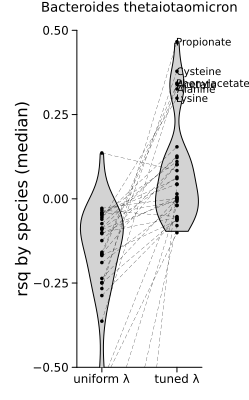

In [19]:
plot(size=(250, 400),
    title=speciesselection[2],
    titlefontsize=9,
    leftmargin=5Plots.mm,
    rightmargin=1Plots.cm,
    ylabel="rsq by species (median)",
    # xrotation=10,
    yticks=[-0.5, -0.25, 0.0, 0.25, 0.5],
    ylims=(-0.5, 0.5)
)
@df filter(:Species => ==(speciesselection[2]), pltdf_acrossspecies) violin!(
    ["uniform λ"], :rsq_by_species_median,
    color=:lightgrey,
    outliers=false,
)

@df filter(:Species => ==(speciesselection[2]), pltdf_acrossspecies) dotplot!(
    ["uniform λ"], :rsq_by_species_median,
    ms=2, msw=0, color=:black, mode=:none,
)
@df filter(:Species => ==(speciesselection[2]), pltdf_speciesspecific) violin!(
    ["tuned λ"], :rsq_by_species_median,
    color=:lightgrey,
    outliers=false,
)

@df filter(:Species => ==(speciesselection[2]), pltdf_speciesspecific) dotplot!(
    ["tuned λ"], :rsq_by_species_median,
    ms=2, msw=0, color=:black, mode=:none,
)

xs = [[0.5, 1.9, NaN] for _ in 1:nrow(filter(:Species => ==(speciesselection[2]), pltdf_acrossspecies))] |> 
    x->reduce(vcat, x);
ys = [[y1, y2, NaN] for (y1, y2) in zip(
    filter(:Species => ==(speciesselection[2]), pltdf_acrossspecies).rsq_by_species_median,
    filter(:Species => ==(speciesselection[2]), pltdf_speciesspecific).rsq_by_species_median,
)] |> x->reduce(vcat, x);
plot!(xs, ys, linewidth=0.25, linestyle=:dash, color=:black)

@df subset(pltdf_speciesspecific,
    :rsq_by_species_median => ByRow(>(0.2)),
    :Species => ByRow(==(speciesselection[2]))
) annotate!(
    ["tuned λ"], :rsq_by_species_median, text.(:metabolite_label, :left, 7),
)

In [20]:
savefig(joinpath(pdir, "btheta-rsq_by_species-violins.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/btheta-rsq_by_species-violins.pdf"

## Predictions for *B. luti* and *B. thetaiotaomicron*

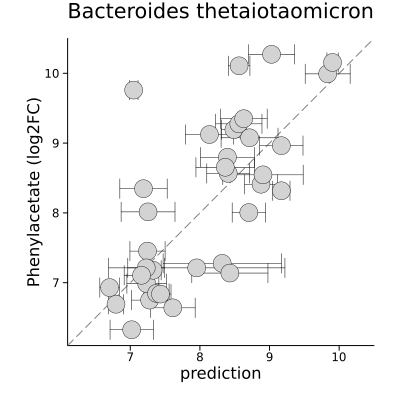

In [24]:
metabolite = "Phenylacetate"
species = "Bacteroides thetaiotaomicron"

pltdf = @chain oof_preds_df_stacked begin
    leftjoin(biobank.obs[:, [:Strain_ID, :Species]], on=:msk_id => :Strain_ID)
    subset(
        :metabolite_label => ByRow(==(metabolite)),
        :Species => ByRow(==(species)),
        :lambda => ByRow(>=(1e-3)),
    )
    groupby([:metabolite_label, :resample, :fold, :lambda])
    transform!(
        [:preds, :truth] => ((yhat, y)->rsquared(yhat, y)) => :rsq_by_species,
    )
    groupby([:resample, :fold])
    subset(
        :rsq_by_species => (x->x .== maximum(x)),
    )
    groupby(:msk_id)
    combine(
        :truth => (only∘unique) => identity,
        :preds => mean,
        :preds => std,
        :rsq_by_species => mean,
        nrow,
    )
end

plot(
    size=(400, 400),
    ratio=1,
    title=species,
    xlabel="prediction",
    ylabel="$metabolite (log2FC)",
    lims=(6.1,10.5),
)
plot!(identity, 6.1, 10.5, c=:grey, linestyle=:dash,)
@df pltdf scatter!(
    :preds_mean, :truth,
    xerror=:preds_std,
    color=:lightgrey,
    markersize=10,
    msw=0.5,
)

In [25]:
savefig(joinpath(pdir, "preds_$species-$metabolite-scatter.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/preds_Bacteroides thetaiotaomicron-Phenylacetate-scatter.pdf"

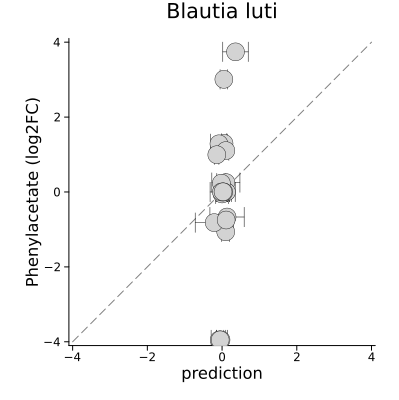

In [26]:
metabolite = "Phenylacetate"
species = "Blautia luti"

pltdf = @chain oof_preds_df_stacked begin
    leftjoin(biobank.obs[:, [:Strain_ID, :Species]], on=:msk_id => :Strain_ID)
    subset(
        :metabolite_label => ByRow(==(metabolite)),
        :Species => ByRow(==(species)),
        :lambda => ByRow(>=(1e-3)),
    )
    groupby([:metabolite_label, :resample, :fold, :lambda])
    transform!(
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsq_by_species,
    )
    groupby([:resample, :fold])
    subset(
        :rsq_by_species => (x -> x .== maximum(x)),
    )
    groupby(:msk_id)
    combine(
        :truth => (only ∘ unique) => identity,
        :preds => mean,
        :preds => std,
        :rsq_by_species => median,
        nrow,
    )
end

plot(
    size=(400, 400),
    ratio=1,
    title=species,
    xlabel="prediction",
    ylabel="$metabolite (log2FC)",
    lims=(-4.1, 4.1)
)
plot!(identity, -4, 4, c=:grey, linestyle=:dash,)
@df pltdf scatter!(
    :preds_mean, :truth,
    xerror=:preds_std,
    color=:lightgrey,
    markersize=10,
    msw=0.5,
)

In [27]:
savefig(joinpath(pdir, "preds_$species-$metabolite-scatter.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/preds_Blautia luti-Phenylacetate-scatter.pdf"

# *B. breve* & *B. thetaiotaomicron* subtrees

In [28]:
strvar_tree = readnw(readline(datadir("exp_pro","BB669","strvar-spitree.nw")));
strvarobs = biobank.obs[indexin(getleafnames(strvar_tree), biobank.obs.Strain_ID), :];

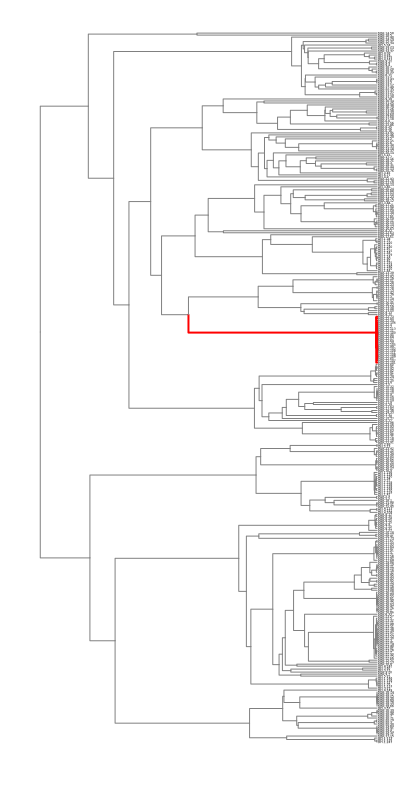

In [29]:
branchcolors = map(prewalk(strvar_tree)) do node
    lf_names = getleafnames(node)
    idx = indexin(lf_names, strvarobs.Strain_ID)
    if all(==("Bifidobacterium breve"), strvarobs.Species[idx])
        return :red
    end
    return :grey
end

plot(strvar_tree,
    # framestyle=:axis,
    # scalebar=true,
    size=(400, 800),
    fs = 2,
    linecolor=permutedims(branchcolors[2:end]),
    linewidth=permutedims(ifelse.(branchcolors[2:end] .== :red, 2, 1)),
)

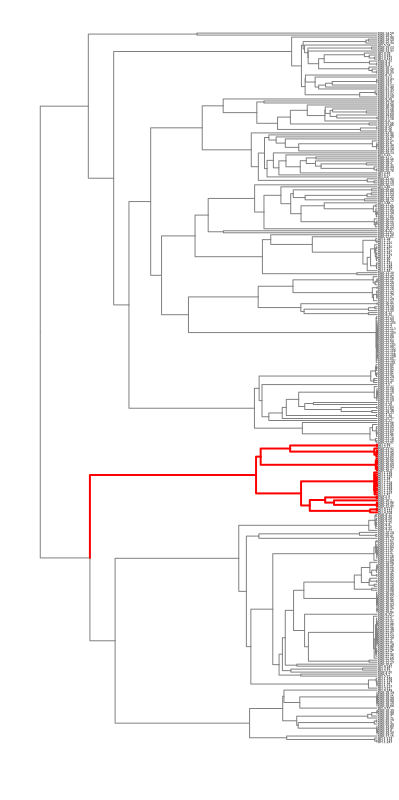

In [30]:
branchcolors = map(prewalk(strvar_tree)) do node
    lf_names = getleafnames(node)
    idx = indexin(lf_names, strvarobs.Strain_ID)
    if all(==("Bacteroides thetaiotaomicron"), strvarobs.Species[idx])
        return :red
    end
    return :grey
end

plot(strvar_tree,
    size=(400, 800),
    fs = 2,
    linecolor=permutedims(branchcolors[2:end]),
    linewidth=permutedims(ifelse.(branchcolors[2:end] .== :red, 2, 1)),
)

In [33]:
theta_subtree = @chain begin
    strvarobs.Strain_ID[strvarobs.Species.=="Bacteroides thetaiotaomicron"]
    NewickTree.extract(strvar_tree, _)
    nwstr
    readnw
end


theta_donorids = sort(unique(strvarobs.Donor[indexin(getleafnames(theta_subtree), strvarobs.Strain_ID)]))
donordict = Dict(
    k=>v for (k, v) in zip(theta_donorids, palette(:tab20, 15))
)
branchcolors = map(prewalk(theta_subtree)) do node
    lf_names = getleafnames(node)
    idx = indexin(lf_names, strvarobs.Strain_ID)
    donordict[mode(strvarobs.Donor[idx])]
end

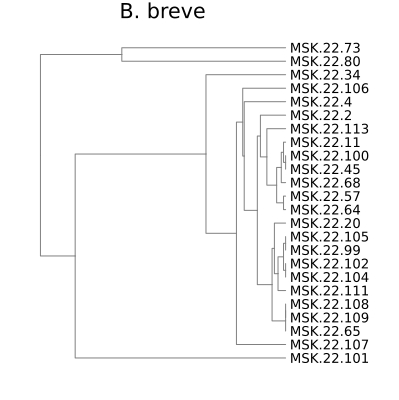

In [37]:
breve_subtree = @chain begin
    strvarobs.Strain_ID[strvarobs.Species.=="Bifidobacterium breve"]
    NewickTree.extract(strvar_tree, _)
    nwstr
    readnw
end
plot(
    size=(400,400),
    rightmargin=2.5Plots.cm,
    title="B. breve",
)
p1 = plot!(breve_subtree, linecolor=:grey, lw=1)

(x2 - x1) ÷ scalebar = 1.0


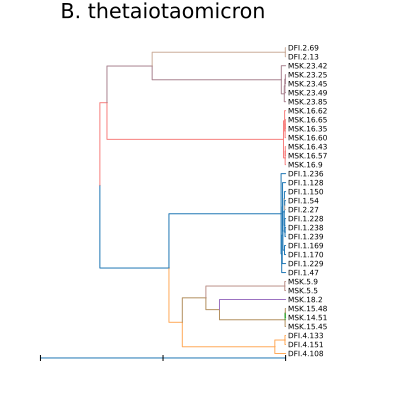

In [38]:
plot(
    size=(400, 400),
    rightmargin=2.5Plots.cm,
    title="B. thetaiotaomicron",
)
p2 = plot!(theta_subtree, 
    linecolor=permutedims(branchcolors[2:end]),
    scalebar=true,
    fs=5
)

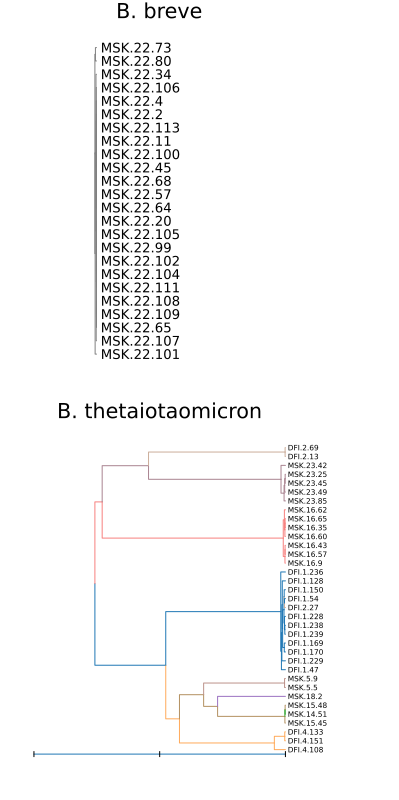

In [39]:
plot(p1, p2, layout=grid(2,1), size=(400, 800), link=:x)

In [40]:
savefig(joinpath(pdir, "subtrees_breve-theta.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/subtrees_breve-theta.pdf"

## Predictive capacity compared to Seperability index

In [41]:
pltdf = @chain allmodels_mdlstats begin
    # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(:adj_rsq_by_species => (x -> x .== maximum(x)))
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(:lambda => (x -> x .== maximum(x)))
end
first(pltdf, 5)

Row,metabolite_label,fold,resample,lambda,Species,full_adj_rsq_mean,cor_mean,degrees_freedom,orig_degrees_freedom,donor_count,strain_level,strain_count,truth_std,truth_var,donor_entropy,rsq_by_species,cor_by_species,truth_mean_by_donor_var,truth_mean_by_donor_std,truth_var_by_donor_mean,truth_std_by_donor_mean,adj_rsq_by_species,inter_intra_donor_var,inter_intra_donor_std
,String31,Int64?,Int64?,Float64,String?,Float64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Propionate,2,1,0.001,Blautia luti,-0.919329,0.681237,183,266.0,1,0.863388,6,0.266356,0.0709453,1.38629,0.644054,0.846104,0.063884,0.252753,0.0117689,0.0626335,-0.150313,1.87242,1.88705
2,Tyrosine,2,1,0.001,[Eubacterium] rectale,-1.05332,0.0986314,40,266.0,1,0.9,5,0.00350649,1.22955e-5,1.03972,0.948215,1.0,1.22955e-5,0.00350649,0.0,0.0,0.939008,0.00226876,0.534889
3,3-Aminoisobutyrate,4,1,0.001,[Ruminococcus] gnavus,-0.758182,0.337002,68,266.0,1,0.882353,10,0.789612,0.623488,0.950271,0.619201,1.0,0.0692764,0.263204,0.623488,0.55834,0.487758,-3.03373,-1.06281
4,Hexanoate,4,1,0.001,Bifidobacterium breve,-2.12527,0.400357,176,266.0,1,0.909091,6,0.102369,0.0104793,-0.0,0.16437,0.50551,0.0,0.0,0.0104793,0.102369,-1.48811,-1.22734,-3.81795
5,3-Aminoisobutyrate,1,2,0.001,[Ruminococcus] gnavus,-0.758182,0.337002,61,266.0,1,0.918033,11,0.80168,0.642691,1.93133,0.346946,0.717295,0.292108,0.540471,0.39839,0.425542,0.15167,-0.437616,0.339372


In [42]:
## Fisher's exact tests ##

# top right
null_val = nrow(pltdf) * (mean(>(0), pltdf.adj_rsq_by_species) * mean(>(0), pltdf.inter_intra_donor_std))
point_est = sum(pltdf.adj_rsq_by_species .> 0.0 .&& pltdf.inter_intra_donor_std .> 0)
se = sqrt(null_val)
zval = (point_est - null_val) / se
p1 = (1 - cdf(Normal(), zval)) * 2 * 4

# top left
null_val = nrow(pltdf) * (mean(>(0), pltdf.adj_rsq_by_species) * mean(<(0), pltdf.inter_intra_donor_std))
point_est = sum(pltdf.adj_rsq_by_species .> 0.0 .&& pltdf.inter_intra_donor_std .< 0)
se = sqrt(null_val)
zval = (point_est - null_val) / se
p2 = (1 - cdf(Normal(), abs(zval))) * 2 * 4

# bottom right
null_val = nrow(pltdf) * (mean(<(0), pltdf.adj_rsq_by_species) * mean(<(0), pltdf.inter_intra_donor_std))
point_est = sum(pltdf.adj_rsq_by_species .< 0.0 .&& pltdf.inter_intra_donor_std .< 0)
se = sqrt(null_val)
zval = (point_est - null_val) / se
p3 = (1 - cdf(Normal(), abs(zval))) * 2 * 4

# bottom left
null_val = nrow(pltdf) * (mean(<(0), pltdf.adj_rsq_by_species) * mean(>(0), pltdf.inter_intra_donor_std))
point_est = sum(pltdf.adj_rsq_by_species .< 0.0 .&& pltdf.inter_intra_donor_std .> 0)
se = sqrt(null_val)
zval = (point_est - null_val) / se
p4 = (1 - cdf(Normal(), abs(zval))) * 2 * 4

# all pvalues
@show (p1, p2, p3, p4);

(p1, p2, p3, p4) = (1.6814441720747197e-5, 0.0020987182166916085, 0.5621612992718159, 0.20214978341148448)


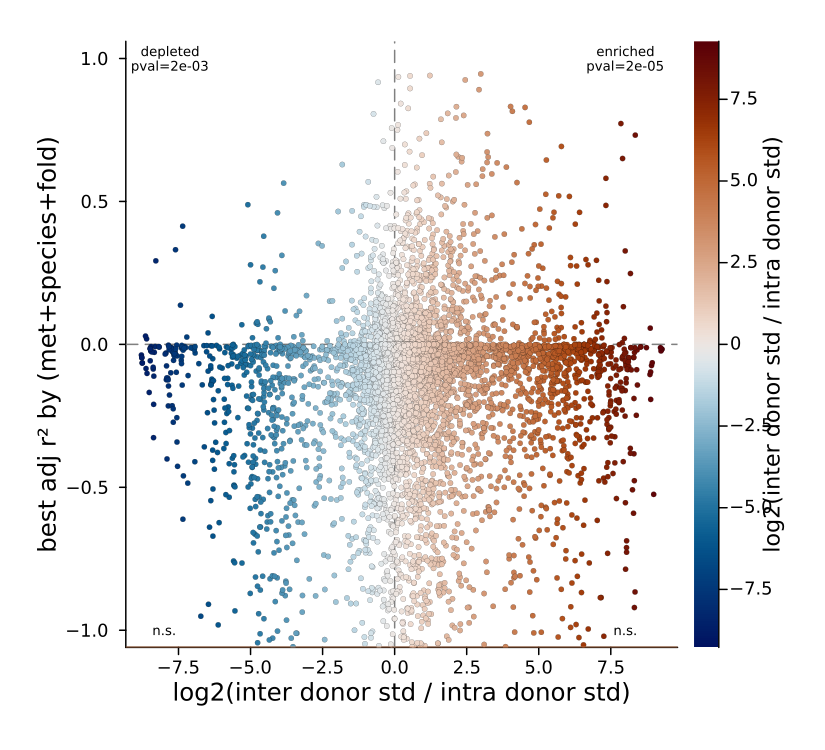

In [43]:
plot(
    ylabel="best adj r² by (met+species+fold)",
    xlabel="log2(inter donor std / intra donor std)",
    colorbartitle="log2(inter donor std / intra donor std)",
    # colorbartitle="lambda",
    ylims=(-1, 1),
    widen=true,
    size=(550, 500),
    margin=5Plots.mm,
    format=:png,
    dpi=150,
)
vline!([0], linestyle=:dash, c=:grey)
hline!([0], linestyle=:dash, c=:grey)
@df pltdf scatter!(:inter_intra_donor_std, :adj_rsq_by_species,
    ms=2, markerstrokewidth=0.1, marker_z=:inter_intra_donor_std,
    clims=getlims(:inter_intra_donor_std),
    c=:vik,

    # marker_z=log10.(:lambda), 
    # c=:viridis,
)
annotate!(8, 1, text("enriched\npval=$(@sprintf("%.0e", p1))", 6))
annotate!(-7.8, 1, text("depleted\npval=$(@sprintf("%.0e", p2))", 6))
annotate!(8, -1, text("n.s.", 6))
annotate!(-8, -1, text("n.s.", 6))
hline!([-1.06])

## Luti and Breve hamming distance

In [48]:
log10p1(x) = log10(x + 1)

log10p1 (generic function with 1 method)

In [44]:
lutisubset = biobank[strvarobs.Strain_ID[strvarobs.Species.=="Blautia luti"], :]
brevesubset = biobank[strvarobs.Strain_ID[strvarobs.Species.=="Bifidobacterium breve"], :]
thetasubset = biobank[strvarobs.Strain_ID[strvarobs.Species.=="Bacteroides thetaiotaomicron"], :]

MuData object 35 ✕ 21475
└ metabolites_foldchange
  AnnData object 35 ✕ 50
└ oggs
  AnnData object 35 ✕ 11248
└ UPorder_oggs
  AnnData object 35 ✕ 10177

In [45]:
luti_Hij = pairwise(Cityblock(), lutisubset["oggs"].X[:,:] .> 0, dims=1)
theta_Hij = pairwise(Cityblock(), thetasubset["oggs"].X[:,:] .> 0, dims=1)
breve_Hij = pairwise(Cityblock(), brevesubset["oggs"].X[:,:] .> 0, dims=1);

In [46]:
uptri = triu(trues(size(breve_Hij)), 1);

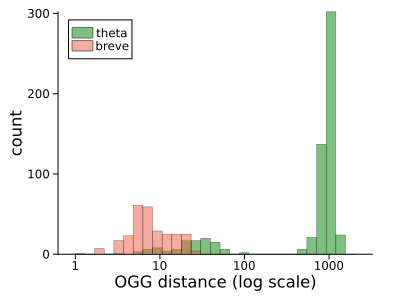

In [54]:
luti_Hij = pairwise(Cityblock(), lutisubset["oggs"].X[:,:], dims=1)
theta_Hij = pairwise(Cityblock(), thetasubset["oggs"].X[:,:], dims=1)
breve_Hij = pairwise(Cityblock(), brevesubset["oggs"].X[:,:], dims=1);

binedges = range(0, log10(maximum(luti_Hij)), length=30);
plot(
    size=(400, 300),
    xticks=(0:3, [1, 10, 100, 1000]),
    xlabel="OGG distance (log scale)",
    ylabel="count",
    # yscale=log10,
    rightmargin=5Plots.mm
)
histogram!(log10p1.(theta_Hij[triu(trues(size(theta_Hij)), 1)]),
    bins=binedges,
    alpha=0.5,
    label="theta",
    c=:green,
    lw=0.5
)
histogram!(log10p1.(breve_Hij[triu(trues(size(breve_Hij)), 1)]),
    bins=binedges,
    alpha=0.5,
    label="breve",
    c=:tomato2,
    lw=0.5
)
# histogram!(log10p1.(luti_Hij[triu(trues(size(luti_Hij)), 1)]),
#     bins=binedges,
#     alpha=0.5,
#     label="luti",
#     c=:purple,
#     lw=0.5
# )

In [55]:
savefig(joinpath(pdir, "ogg_distance_abundence-theta-breve-histogram.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/ogg_distance_abundence-theta-breve-histogram.pdf"

## distribution of inter vs. intra donor distances

In [56]:
strvar = biobank[biobank.obs.kept_species, :]

MuData object 356 ✕ 21475
└ metabolites_foldchange
  AnnData object 356 ✕ 50
└ oggs
  AnnData object 356 ✕ 11248
└ UPorder_oggs
  AnnData object 356 ✕ 10177

In [57]:
outer(f, x) = f.(x, permutedims(x))

outer (generic function with 1 method)

In [58]:
strvar_oggdists = pairwise(Cityblock(), strvar["oggs"].X[:,:], dims=1)
uptri = triu(trues(size(strvar_oggdists)), 1)
intradonor_mask = uptri .&& outer(==, strvar.obs.Species) .&& outer(==, strvar.obs.Donor)
interdonor_mask = uptri .&& outer(==, strvar.obs.Species) .&& outer(!=, strvar.obs.Donor);

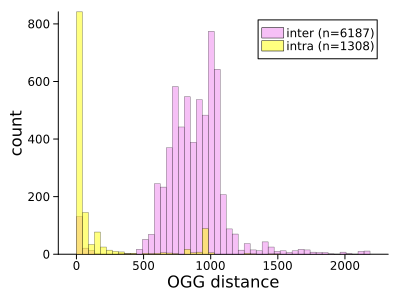

In [65]:
binedges = range(0, maximum(strvar_oggdists[interdonor_mask]), length=50);
plot(
    size=(400, 300),
    # xticks=(0:3, [1, 10, 100, 1000]),
    xlabel="OGG distance",
    ylabel="count",
    # yscale=:log10,
)
histogram!(strvar_oggdists[interdonor_mask],
    bins=binedges,
    alpha=0.5,
    label="inter (n=$(length(strvar_oggdists[interdonor_mask])))",
    c=:violet,
    lw=0.5
)
histogram!(strvar_oggdists[intradonor_mask],
    bins=binedges,
    alpha=0.5,
    label="intra (n=$(length(strvar_oggdists[intradonor_mask])))",
    c=:yellow,
    lw=0.5
)


In [66]:
savefig(joinpath(pdir, "inter-intra-donor_histogram_oggdistance.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/inter-intra-donor_histogram_oggdistance.pdf"

# Fig. S18 species specific sub-species branches

## Panel A

In [67]:
pltdf_speciesspecific = @chain allmodels_mdlstats begin
    # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(:rsq_by_species => (x -> x .== maximum(x)))
    groupby([:metabolite_label, :fold, :resample, :Species])
    subset(
        :lambda => (x -> x .== maximum(x)),
        :truth_std => ByRow(>(0)),
    )
    DataFrames.transform(
        :strain_level => (x -> replace(x, NaN => 0.0)) => identity,
    )
    groupby([:metabolite_label, :Species])
    combine(
        :rsq_by_species => median,
        :strain_level => median,
        :strain_level => mean,
        :strain_level => std,
    )
end

pltdf_acrossspecies = @chain allmodels_mdlstats begin
    # select(:metabolite_label, :lambda, :Species, :rsq_by_species, :inter_intra_donor_std)
    groupby([:metabolite_label, :fold, :resample])
    subset(:full_adj_rsq_mean => (x -> x .== maximum(x)))
    groupby([:metabolite_label, :fold, :resample])
    subset(
        # :Species => (only ∘ unique)
        :lambda => (x -> x .== maximum(x)),
        :truth_std => ByRow(>(0)),
    )
    DataFrames.transform(
        :strain_level => (x -> replace(x, NaN => 0.0)) => identity,
    )
    groupby([:metabolite_label, :Species])
    combine(
        :lambda => (only ∘ unique) => identity,
        :rsq_by_species => median,
        :strain_level => median,
        :strain_level => mean,
        :strain_level => std,
    )
    sort([:strain_level_mean], rev=true)
end

Row,metabolite_label,Species,lambda,rsq_by_species_median,strain_level_median,strain_level_mean,strain_level_std
,String31,String?,Float64,Float64,Float64,Float64,Float64
1,Tryptamine,Blautia luti,0.20893,-0.395397,0.85,0.849135,0.0649174
2,Tryptamine,Bacteroides thetaiotaomicron,0.20893,-0.553909,0.846053,0.846038,0.0584215
3,3-Aminoisobutyrate,Blautia wexlerae,0.144544,-0.174158,0.846154,0.843771,0.0281707
4,3-Aminoisobutyrate,Phocaeicola vulgatus,0.144544,-0.0442551,0.846154,0.841862,0.0359807
5,3-Aminoisobutyrate,Anaerostipes hadrus,0.144544,-0.0298063,0.846154,0.841862,0.0359807
6,3-Aminoisobutyrate,Bacteroides uniformis,0.144544,-0.206939,0.846154,0.841637,0.0369521
7,Serine,[Ruminococcus] gnavus,0.229087,-0.166372,0.857143,0.839978,0.0611798
8,Serine,Phocaeicola vulgatus,0.229087,-0.336131,0.857143,0.839978,0.0611798
9,Serine,[Eubacterium] rectale,0.229087,-9.85713,0.857143,0.839978,0.0611798


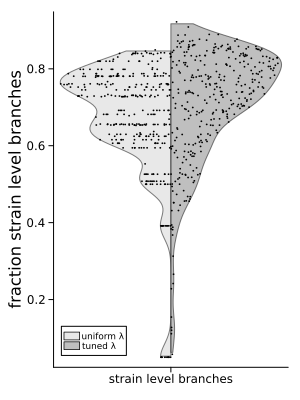

In [68]:
plot(size=(300, 400), 
    ylabel="fraction strain level branches",
    legend=:bottomleft,
    legendfontsize=6,
)
@df pltdf_acrossspecies violin!(
    ["strain level branches"], 
    :strain_level_mean, side=:left, alpha=0.5,
    fillcolor=:lightgrey,
    label="uniform λ",
)
@df pltdf_speciesspecific violin!(
    ["strain level branches"],
    :strain_level_mean, side=:right, alpha=0.5,
    fillcolor=:grey,
    label="tuned λ",
)
@df pltdf_acrossspecies dotplot!(
    ["strain level branches"], :strain_level_mean, 
    side=:left,
    color=:black, msw=0, ms=1,
)
@df pltdf_speciesspecific dotplot!(
    ["strain level branches"], :strain_level_mean, 
    side=:right,
    color=:black, msw=0, ms=1,
)

In [69]:
savefig(joinpath(pdir, "full_strain-level-violinplot.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/full_strain-level-violinplot.pdf"

In [70]:
testresult = MannWhitneyUTest(pltdf_acrossspecies.strain_level_mean, pltdf_speciesspecific.strain_level_mean)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          -0.0136667

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-05

Details:
    number of observations in each group: [345, 345]
    Mann-Whitney-U statistic:             47920.0
    rank sums:                            [107605.0, 130790.0]
    adjustment for ties:                  37362.0
    normal approximation (μ, σ):          (-11592.5, 2617.84)


In [71]:
metabolites_ordered = unique(pltdf_acrossspecies.metabolite_label);

In [72]:
ps = []
for met_label in metabolites_ordered
    p = plot(ytickfontsize=7)
    @df pltdf_acrossspecies violin!(
        [met_label],
        :strain_level_mean, side=:left, alpha=0.5,
        fillcolor=:lightgrey,
        # label="uniform λ",
    )
    @df pltdf_speciesspecific violin!(
        [met_label],
        :strain_level_mean, side=:right, alpha=0.5,
        fillcolor=:grey,
        # label="tuned λ",
    )
    @df filter(:metabolite_label => ==(met_label), pltdf_acrossspecies) dotplot!(
        [0.42],
        :strain_level_mean, side=:left, alpha=0.5,
        msw=0, ms=3, mc=:pink,
        mode=:none,
        # label="uniform λ",
    )
    @df filter(:metabolite_label => ==(met_label), pltdf_speciesspecific) dotplot!(
        [0.58],
        :strain_level_mean, side=:right, alpha=0.5,
        msw=0, ms=3, mc=:red,
        mode=:none,
        # label="tuned λ",
    )
    push!(ps, p)
end

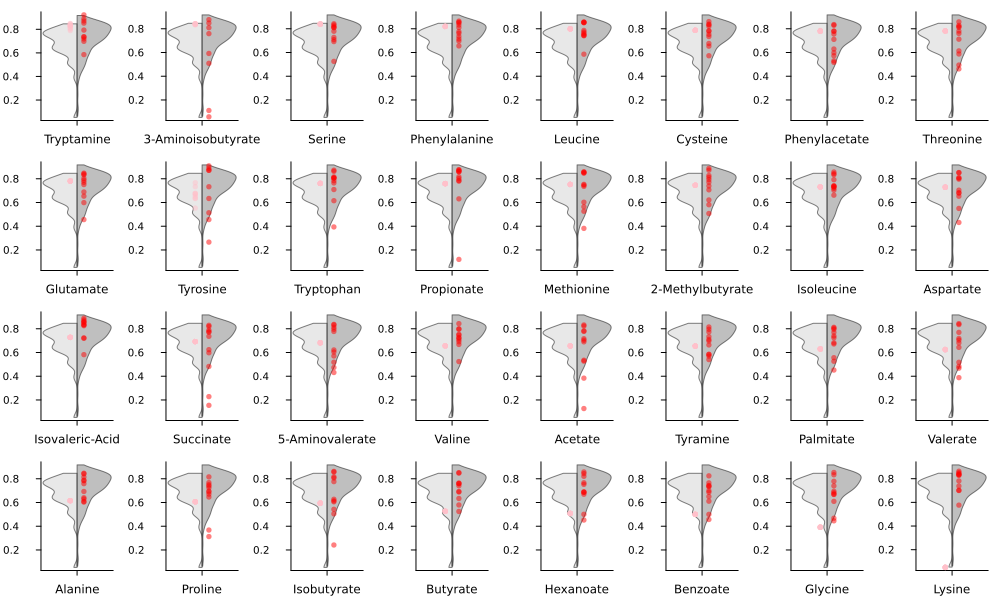

In [73]:
plot(ps..., layout=grid(4, 8), size=(1000,600))

In [74]:
savefig(joinpath(pdir, "strain-level-branches_facetviolins.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/strain-level-branches_facetviolins.pdf"

## Panel B

In [75]:
mdlstatsdf_meansdf =
    @chain mdlstatsdf begin
        subset(:lambda => ByRow(>=(1e-3)))
        groupby([:metabolite_label, :lambda])
        combine(
            5:13 .=> mean,
            5:13 .=> std,
        )
    end;

In [76]:
shannon(x) = x |> countmap |> values |> x -> x ./ maximum(x) |> entropy

allmodels_oofpreds =
    @chain mdlstatsdf_meansdf begin
        sort(:rsq_adj_mean, rev=true)
        select([:metabolite_label, :lambda, :rsq_adj_mean])
        leftjoin(oof_preds_df_stacked, on=[:metabolite_label, :lambda])
        leftjoin(mdlstatsdf_stacked, on=[:metabolite_label, :lambda, :fold, :resample])
        leftjoin(select(biobank.obs, [:Strain_ID, :Species, :Donor]), on=:msk_id => :Strain_ID)
    end

allmodels_mdlstats =
    @chain allmodels_oofpreds begin
        groupby([:metabolite_label, :fold, :resample, :lambda, :Species, :Donor])
        transform!(
            :truth => var => :truth_var_by_donor,
            :truth => std => :truth_std_by_donor,
            :truth => mean => :truth_mean_by_donor,
            :Donor => (length ∘ unique) => :donor_count
        )
        groupby([:metabolite_label, :fold, :resample, :lambda, :Species])
        combine(
            :rsq_adj_mean => (only ∘ unique) => :full_adj_rsq_mean,
            :degrees_freedom => (only ∘ unique) => identity,
            :orig_degrees_freedom => (only ∘ unique) => identity,
            :donor_count => (only ∘ unique) => identity,
            nrow => :strain_count,
            :truth => std,
            :truth => var,
            :Donor => shannon => :donor_entropy,
            [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsq_by_species,
            :truth_mean_by_donor => var,
            :truth_mean_by_donor => std,
            :truth_var_by_donor => (x -> mean(replace(x, NaN => 0.0))) => :truth_var_by_donor_mean,
            :truth_std_by_donor => (x -> mean(replace(x, NaN => 0.0))) => :truth_std_by_donor_mean,
        )
        transform!(
            [:rsq_by_species, :orig_degrees_freedom, :degrees_freedom] => ByRow((r, n, d) -> adjust_rsquared(r, n, d)) => :adj_rsq_by_species,
            [:truth_mean_by_donor_var, :truth_var_by_donor_mean] => ByRow((x, y) -> log2((x + 1 / 2^7) / (y + 1 / 2^7))) => :inter_intra_donor_var,
            [:truth_mean_by_donor_std, :truth_std_by_donor_mean] => ByRow((x, y) -> log2((x + 1 / 2^7) / (y + 1 / 2^7))) => :inter_intra_donor_std,
        )
    end;

In [77]:
bestlambdamodels_uniform = @chain mdlstatsdf_meansdf begin
    groupby(:metabolite_label)
    subset(:rsq_adj_mean => (x -> x .== maximum(x)))
end;

In [83]:
bestlambdamodels_tuned_by_species = @chain allmodels_mdlstats begin
    @groupby([:metabolite_label, :Species, :fold, :resample])
    @subset(:rsq_by_species .== maximum(:rsq_by_species))
    @groupby([:metabolite_label, :Species, :fold, :resample])
    @subset(:lambda .== maximum(:lambda), :truth_std .> 0)
    @groupby([:metabolite_label, :Species])
    # @subset(:rsq_by_species .== median(:rsq_by_species))
    @combine(
        :mean_predictive_capacity = mean(:rsq_by_species),
        :rsq_by_species = median(:rsq_by_species),
        :mean_lambda = mean(:lambda),
        :max_lambda = maximum(:lambda),
    )
    # @rsubset(isfinite(:median_rsq))
    @groupby(:metabolite_label)
    @transform(:mean_median_rsq_by_metabolite = mean(:rsq_by_species))
    @groupby(:Species)
    @transform(:mean_median_rsq_by_species = mean(:rsq_by_species))
    sort([:mean_median_rsq_by_species, :mean_median_rsq_by_metabolite], rev=true)
end;

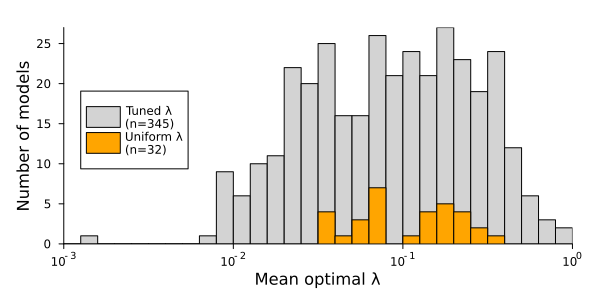

In [84]:
plot(
    size=(600, 300),
    xlims=(-3, 0),
    margin=5Plots.mm,
    # yticks=0:3:6
    xticks=(-3:0, [LaTeXString("10^{$i}") for i in -3:0]),
    xlabel="Mean optimal λ",
    ylabel="Number of models",
    legend=:left
)
histogram!(log10.(bestlambdamodels_tuned_by_species.mean_lambda), bins=-3:0.1:0, c=:lightgrey,
    label="Tuned λ\n(n=$(nrow(bestlambdamodels_tuned_by_species)))",
)
histogram!(log10.(bestlambdamodels_uniform.lambda), bins=-3:0.1:0, c=:orange,
    label="Uniform λ\n(n=$(nrow(bestlambdamodels_uniform)))"
)

In [85]:
savefig(joinpath(pdir, "optimized-lambda-tuned-vs-uniform-models.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/optimized-lambda-tuned-vs-uniform-models.pdf"

# Fig. S19

In [86]:
oof_dropout_preds_df_stacked = CSV.read(joinpath(rdir, "oof_dropout_predictions_stacked_SLE_lambda=many.csv"), DataFrame)
oof_dropout_preds_df_stacked =
    @chain oof_dropout_preds_df_stacked begin
        stack(8:108)
        transform!(:variable => ByRow(s -> parse(Float64, last(split(s, "_")))) => :lambda)
        select(Not([:variable, :value]), :value => :preds)
    end

shannon(x) = x |> countmap |> values |> x -> x ./ maximum(x) |> entropy

allmodels_oofpreds_dropout =
    @chain mdlstatsdf_meansdf begin
        sort(:rsq_adj_mean, rev=true)
        select([:metabolite_label, :lambda, :rsq_adj_mean])
        leftjoin(oof_dropout_preds_df_stacked, on=[:metabolite_label, :lambda])
        leftjoin(mdlstatsdf_stacked, on=[:metabolite_label, :lambda, :fold, :resample])
        leftjoin(select(biobank.obs, [:Strain_ID, :Species, :Donor]), on=:msk_id => :Strain_ID)
    end

allmodels_mdlstats_dropout =
    @chain allmodels_oofpreds_dropout begin
        groupby([:metabolite_label, :fold, :resample, :lambda, :Species, :Donor])
        transform!(
            :truth => var => :truth_var_by_donor,
            :truth => std => :truth_std_by_donor,
            :truth => mean => :truth_mean_by_donor,
            :Donor => (length ∘ unique) => :donor_count
        )
        groupby([:metabolite_label, :fold, :resample, :lambda, :Species])
        combine(
            :rsq_adj_mean => (only ∘ unique) => :full_adj_rsq_mean,
            :degrees_freedom => (only ∘ unique) => identity,
            :orig_degrees_freedom => (only ∘ unique) => identity,
            :donor_count => (only ∘ unique) => identity,
            nrow => :strain_count,
            :truth => std,
            :truth => var,
            :Donor => shannon => :donor_entropy,
            [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsq_by_species,
            :truth_mean_by_donor => var,
            :truth_mean_by_donor => std,
            :truth_var_by_donor => (x -> mean(replace(x, NaN => 0.0))) => :truth_var_by_donor_mean,
            :truth_std_by_donor => (x -> mean(replace(x, NaN => 0.0))) => :truth_std_by_donor_mean,
        )
        transform!(
            [:rsq_by_species, :orig_degrees_freedom, :degrees_freedom] => ByRow((r, n, d) -> adjust_rsquared(r, n, d)) => :adj_rsq_by_species,
            [:truth_mean_by_donor_var, :truth_var_by_donor_mean] => ByRow((x, y) -> log2((x + 1 / 2^7) / (y + 1 / 2^7))) => :inter_intra_donor_var,
            [:truth_mean_by_donor_std, :truth_std_by_donor_mean] => ByRow((x, y) -> log2((x + 1 / 2^7) / (y + 1 / 2^7))) => :inter_intra_donor_std,
        )
    end;

In [87]:
allmodels_mdlstats_dropout_renamed = @select(allmodels_mdlstats_dropout,
    :metabolite_label, :fold, :resample, :lambda, :Species,
    :rsq_by_species_dropout = :rsq_by_species,
);

In [88]:
bestlambdamodels_tuned_by_species_plus_dropout = @chain allmodels_mdlstats begin
    @groupby([:metabolite_label, :Species, :fold, :resample])
    @subset(:rsq_by_species .== maximum(:rsq_by_species))
    @groupby([:metabolite_label, :Species, :fold, :resample])
    @subset(:lambda .== maximum(:lambda), :truth_std .> 0)
    leftjoin(allmodels_mdlstats_dropout_renamed, on=[:metabolite_label, :fold, :resample, :lambda, :Species])
    @groupby([:metabolite_label, :Species])
    @combine(
        :mean_predictive_capacity = mean(:rsq_by_species),
        :rsq_by_species = median(:rsq_by_species),
        :rsq_by_species_dropout = median(:rsq_by_species_dropout),
        :mean_lambda = mean(:lambda),
        :max_lambda = maximum(:lambda),
    )
    @groupby(:metabolite_label)
    @transform(:mean_median_rsq_by_metabolite = mean(:rsq_by_species))
    @groupby(:Species)
    @transform(:mean_median_rsq_by_species = mean(:rsq_by_species))
    sort([:mean_median_rsq_by_species, :mean_median_rsq_by_metabolite], rev=true)
end

Row,metabolite_label,Species,mean_predictive_capacity,rsq_by_species,rsq_by_species_dropout,mean_lambda,max_lambda,mean_median_rsq_by_metabolite,mean_median_rsq_by_species
,String31,String?,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Cysteine,[Ruminococcus] gnavus,0.0128672,0.0965039,-0.0343479,0.0327652,0.0691831,0.0764563,0.174737
2,Propionate,[Ruminococcus] gnavus,0.138127,0.119163,-47.7003,0.00975067,0.0275423,0.0652717,0.174737
3,Tryptophan,[Ruminococcus] gnavus,0.401141,0.441328,-1.64052,0.01707,0.0398107,0.0611323,0.174737
4,Aspartate,[Ruminococcus] gnavus,0.201159,0.234688,-3.3397,0.0389619,0.190546,0.0496915,0.174737
5,Lysine,[Ruminococcus] gnavus,0.298371,0.288946,-0.177554,0.0679401,1.0,0.0432813,0.174737
6,Leucine,[Ruminococcus] gnavus,0.27059,0.243674,-1.51279,0.0149812,0.109648,0.0401996,0.174737
7,Isoleucine,[Ruminococcus] gnavus,0.26354,0.263936,-0.523406,0.113593,1.0,0.0381895,0.174737
8,3-Aminoisobutyrate,[Ruminococcus] gnavus,0.337891,0.388087,-0.111111,0.33673,1.0,0.0359864,0.174737
9,Phenylacetate,[Ruminococcus] gnavus,-0.0427623,0.0207234,-0.781171,0.14188,0.57544,0.0343253,0.174737


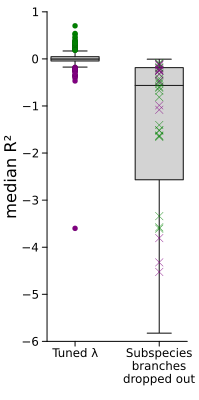

In [89]:
plot(
    ylabel="median R²",
    size=(200, 400),
    ylims=(-6, 1),
    xrotation=0,
)
@df bestlambdamodels_tuned_by_species_plus_dropout begin
    boxplot!(
        ["Tuned λ"], :rsq_by_species;
        msw=0.25,
        color=:lightgrey,
        markersize=3,
        outliers=false,
    )
end
@df bestlambdamodels_tuned_by_species_plus_dropout begin
    boxplot!(
        ["Subspecies\nbranches\ndropped out"], :rsq_by_species_dropout;
        color=:lightgrey,
        outliers=false,
    )
end

upper_outliers = @subset(bestlambdamodels_tuned_by_species_plus_dropout, 
    :rsq_by_species .> (quantile(:rsq_by_species, 0.75) + (1.5 * iqr(:rsq_by_species)))
)
@df upper_outliers dotplot!(["Tuned λ"], :rsq_by_species;
    mode=:none, color=:green, markersize=3, msw=0.1
)
@df upper_outliers dotplot!(["Subspecies\nbranches\ndropped out"], :rsq_by_species_dropout;
    marker=:x, mode=:none, color=:green,
)
lower_outliers = @subset(bestlambdamodels_tuned_by_species_plus_dropout, 
    :rsq_by_species .< (quantile(:rsq_by_species, 0.25) - (1.5 * iqr(:rsq_by_species)))
)
@df lower_outliers dotplot!(["Tuned λ"], :rsq_by_species;
    mode=:none, color=:purple, markersize=3, msw=0.1
)
@df lower_outliers dotplot!(["Subspecies\nbranches\ndropped out"], :rsq_by_species_dropout;
    marker=:x, mode=:none, color=:purple,
)

In [90]:
savefig(joinpath(pdir, "median_rsq_dropping_out_subspecies_branches.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_model_outofbag/median_rsq_dropping_out_subspecies_branches.pdf"

In [91]:
@with bestlambdamodels_tuned_by_species_plus_dropout begin
    MannWhitneyUTest(:rsq_by_species, :rsq_by_species_dropout)
end

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.562941

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-94

Details:
    number of observations in each group: [345, 345]
    Mann-Whitney-U statistic:             113703.0
    rank sums:                            [173388.0, 65007.0]
    adjustment for ties:                  66.0
    normal approximation (μ, σ):          (54190.5, 2617.99)


In [92]:
@with upper_outliers begin
    MannWhitneyUTest(:rsq_by_species, :rsq_by_species_dropout)
end

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          1.03929

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-09

Details:
    number of observations in each group: [28, 28]
    Mann-Whitney-U statistic:             784.0
    rank sums:                            [1190.0, 406.0]
    adjustment for ties:                  0.0
    normal approximation (μ, σ):          (392.0, 61.0246)


In [93]:
@with lower_outliers begin
    MannWhitneyUTest(:rsq_by_species, :rsq_by_species_dropout)
end

Exact Mann-Whitney U test
-------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.733893

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0358

Details:
    number of observations in each group: [21, 21]
    Mann-Whitney-U statistic:             304.0
    rank sums:                            [535.0, 368.0]
    adjustment for ties:                  0.0
